In [112]:
import os
from pathlib import Path

import numpy as np
import audiotools
import auraloss
import pandas as pd
from audiotools import AudioSignal

import matplotlib.pyplot as plt
import torch
import helper
import IPython.display
# dir(helper)

NOTEBOOKS_DIR = Path(os.path.abspath(''))
PROJECT_DIR = NOTEBOOKS_DIR.parent
ASSETS_DIR = PROJECT_DIR / "assets"
PRETRAINED_DIR = PROJECT_DIR / "pretrained"
DATA_DIR = PROJECT_DIR / "data"
RUNS_DIR = PROJECT_DIR / "runs"
EXPERIMENTS_DIR = PROJECT_DIR / "experiments"

LAION_CLAP_OUTPUTS =CLAP_OUTPUT_FOLDER / "laion_clap" 
MS_CLAP_OUTPUTS = CLAP_OUTPUT_FOLDER / "ms_clap" 
AUDEALIZE_GND_TRUTH_DIR = AUDEALIZE_COMP_DIR / "audealize_version"
CLAP_OUTPUT_FOLDER = RUNS_DIR / "test123"

top10_eq = ["warm", "cold", "soft", "loud", "happy", "bright", "soothing", "harsh", "heavy", "cool"]

### May 26: Testing123 Audealize vs MS CLAP vs LAION-CLAP: 
- FX: Just EQ
- Audio Type: Single Guitar Riff
- Words: Top 10 Frequent EQ words (warm 64, cold 34, soft 29, loud 26, happy 22, bright 19, soothing 17, harsh 16, heavy 15, cool 14)
- Test Folder: runs/test123
- Test Description: for ms_clap and laion_clap, I ran 8 trials per top10_eq word total: 5 random init_params seeds, 3 from zero



In [114]:
# checking contents
keyword = 'guitar'
run_number = "zeros_0" #other options are "seed1_0... seed5_0 or zeros_0 up to zeros_3"

# Loading Ground Truth Paths
audealize_out_ALL = helper.load_and_find_path_with_keyword(AUDEALIZE_GND_TRUTH_DIR, [f'{keyword}'], returnSingle=False)
print(len(audealize_out_ALL)) #checking length, should be number of words aka 10
# for path in audealize_out_ALL:
#     print(path)

# Loading all MS CLAP output files
msclap_out_ALL = helper.load_and_find_path_with_keyword(MS_CLAP_OUTPUTS, [f'{keyword}', f'{run_number}', "final"])
print(len(msclap_out_ALL))  #checking length, should be number of words aka 10
# for path in msclap_out_ALL:
#     print(path)

# Loading all MS CLAP output files
laionclap_out_ALL = helper.load_and_find_path_with_keyword(LAION_CLAP_OUTPUTS, [f'{keyword}', f'{run_number}', "final"])
print(len(laionclap_out_ALL))  #checking length, should be number of words aka 10
# for path in laionclap_out_ALL:
#     print(path)

10
10
10


In [115]:
def calc_loss_allwords_onefile_oneaudio(audio_type, model_output_dir, run_version, loss_func=auraloss.freq.MultiResolutionSTFTLoss(), verbose=True):
    losses = {}
    for word in top10_eq:
        audealize_out_word = helper.load_and_find_path_with_keyword(AUDEALIZE_GND_TRUTH_DIR, [f"{audio_type}", f"{word}"], returnSingle=True)
        clap_out_word = helper.load_and_find_path_with_keyword(model_output_dir, [f"{audio_type}", "final", f"{word}", f"{run_version}"], returnSingle=True)
        losses[word] = helper.compare_loss_files_preprocessed(audealize_out_word, clap_out_word, loss_func) #normalized
       
        if verbose:
            print(f'AUDEALIZE_OUT PATH: {audealize_out_word}')
            print(f'CLAP_OUT PATH: {clap_out_word}')

    return pd.DataFrame(list(losses.items()), columns=['word', 'loss'])     # Convert the losses dictionary to a DataFrame
   
def compute_mean_and_std(tensors):
    stacked_tensors = torch.stack(tensors)
    mean_tensor = torch.mean(stacked_tensors)
    std_tensor = torch.std(stacked_tensors)
    return mean_tensor.item(), std_tensor.item()


def calc_loss_allwords_allfiles_oneaudio(clap_output_dir=MS_CLAP_OUTPUTS, target_words=top10_eq, audio_type = 'guitar', run_type = 'seed'):
    results = []
    for word in target_words:
        allseeds_paths = helper.load_and_find_path_with_keyword(clap_output_dir, [f"{audio_type}", "final", f"{word}", f"{run_type}"],returnSingle=False)
        audealize_out_word = helper.load_and_find_path_with_keyword(AUDEALIZE_GND_TRUTH_DIR,[f"{audio_type}", f"{word}"], returnSingle=True)
        
        seed_losses_all = [helper.compare_loss_files_preprocessed(audealize_out_word, seed_path) for seed_path in allseeds_paths]
        average, std = compute_mean_and_std(seed_losses_all)         # Calculate the average and std
        results.append({'word': word, 'average': average, 'std': std})
    
    return pd.DataFrame(results)

 
def plot_loss(df, run_version, avg=False):
    plt.figure(figsize=(10, 6))
    bar_width = 0.35
    index = np.arange(len(df['word']))
    if avg==True:
        label_plus = 'multiple'
        plt.bar(index - bar_width/2, df['average_MS_CLAP'], yerr=df['std_MS_CLAP'], capsize=5, width=bar_width, label='MS_CLAP')
        plt.bar(index + bar_width/2, df['average_LAION_CLAP'], yerr=df['std_LAION_CLAP'], capsize=5, width=bar_width, alpha=0.5, label='LAION_CLAP')
        plt.title('Average STFT Loss by Word (over multiple runs)')
    else:
        label_plus = 'single'
        plt.bar(index - bar_width/2, df['loss_MS_CLAP'], capsize=5, width=bar_width, label='MS_CLAP')
        plt.bar(index + bar_width/2, df['loss_LAION_CLAP'], capsize=5, width=bar_width, alpha=0.5, label='LAION_CLAP')
    plt.title(f'STFT Loss by Word (runs: {label_plus} run, {run_version})')
    plt.xlabel('Word')
    plt.ylabel('STFT Loss (lower is BETTER)')
    plt.xticks(index, df['word'], rotation=45)
    plt.legend()
    
    plt.tight_layout()
    plt.show()


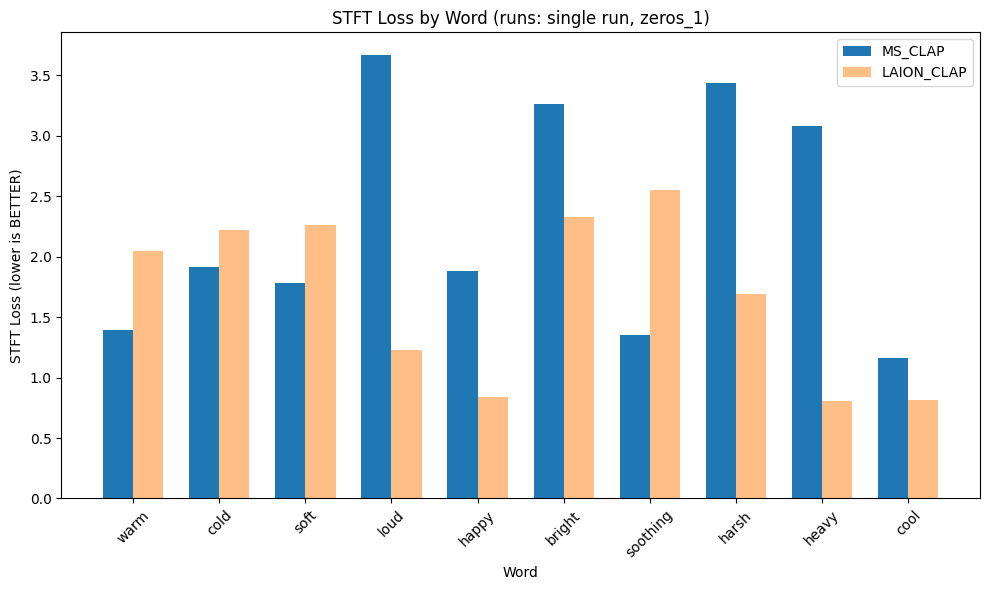

In [101]:
# calculate for a single run
run_version = 'zeros_1'
audio_type = 'guitar'

ms_clap_single_run = calc_loss_allwords_onefile_oneaudio(audio_type, MS_CLAP_OUTPUTS, run_version, verbose=False)
laion_clap_single_run = calc_loss_allwords_onefile_oneaudio(audio_type, LAION_CLAP_OUTPUTS, run_version, verbose=False)
all_clap_single_run = pd.merge(ms_clap_single_run, laion_clap_single_run, on='word', suffixes=('_MS_CLAP', '_LAION_CLAP'))


plot_loss(all_clap_single_run, run_version, avg=False)

In [116]:
# Averaging all runs loss values for single word by run type
run_type = '' #options to specity type of run "", "zero", "seed", or to specify a specific run 'zero_{i}' i in [0,2] or 'seed{i}_0' i in [0,4]
target_word = 'warm'
audio_type = 'guitar'

allseeds_paths = helper.load_and_find_path_with_keyword(MS_CLAP_OUTPUTS, [f"{audio_type}", "final", f"{target_word}", f"{run_type}"], returnSingle=False)
audealize_out_word = helper.load_and_find_path_with_keyword(AUDEALIZE_GND_TRUTH_DIR, [f"{audio_type}", f"{target_word}"], returnSingle=True)
seed_losses_all = [helper.compare_loss_files_preprocessed(audealize_out_word, seed_path) for seed_path in allseeds_paths]

print(f'all seed losses:\n{seed_losses_all}')
print(f'mean & std:\n{compute_mean_and_std(seed_losses_all)}')

for seed_path in allseeds_paths:
    audio = IPython.display.Audio(str(seed_path))
    IPython.display.display(audio)
    print(helper.compare_loss_files_preprocessed(audealize_out_word, seed_path))

all seed losses:
[tensor(1.9824), tensor(1.4588), tensor(1.3946), tensor(3.8543), tensor(1.3918), tensor(1.5431), tensor(3.5510), tensor(1.3920)]
mean & std:
(2.0709853172302246, 1.0290069580078125)


tensor(1.9824)


tensor(1.4588)


tensor(1.3946)


tensor(3.8543)


tensor(1.3918)


tensor(1.5431)


tensor(3.5510)


tensor(1.3920)


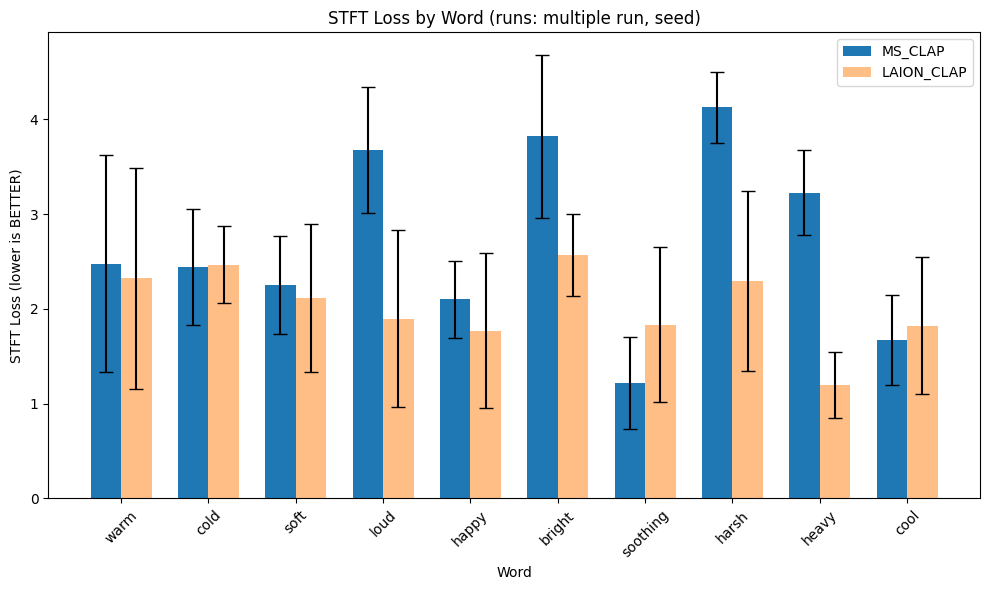

In [103]:
#testing 123
run_version = 'seed' #or '' for all or 'zero' for the zeros

ms_clap_word_stats = calc_loss_allwords_allfiles_oneaudio(MS_CLAP_OUTPUTS, top10_eq, 'guitar', run_version)
laion_clap_word_stats = calc_loss_allwords_allfiles_oneaudio(LAION_CLAP_OUTPUTS, top10_eq, 'guitar', run_version)
all_clap_stats = pd.merge(ms_clap_word_stats, laion_clap_word_stats, on='word', suffixes=('_MS_CLAP', '_LAION_CLAP'))
plot_loss(all_clap_stats, run_version, avg=True)
